# This notebook simulates a simple mountain destroyed by rainfall and glaciers


figured out that scipy zoom really makes the figures shine


## Principles:

* The land starts as rock

* Rain falls on a random set of figures at every step

* Rain flows downhill, and can barely scratch the rock, but drags the gravel along

* The temperature is determined by height

* Rain freezes to glacier if it's below zero

* Glaciers destroy the rock into gravel below them

* Glaciers flow downhill slowly

* When above zero, a glacier melts at a constant rate


In [11]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
# %matplotlib widget
# %matplotlib notebook
import matplotlib as mpl

import scipy.signal as signal
import scipy.ndimage as ndimage
import numba
from numba import jit
import popdyn
import popdyn.convolve as cv
import copy
from importlib import reload
import matplotlib.animation as animation
from IPython.display import HTML

import skimage.transform as sktransform 
from skimage import color, morphology

plt.rcParams["animation.html"] = "jshtml"

# Making a mountainside

In [12]:
def distance_kernel(half_extent=50):
    size = half_extent * 2 + 1
    kernel = np.zeros((size, size))
    vals = np.arange(-half_extent,half_extent+1)
    xx, yy = np.meshgrid(vals, vals, indexing='xy')
    # y, x = np.ogrid[-half_extent:half_extent+1, -half_extent:half_extent+1]
    distance = np.sqrt(xx**2 + yy**2)
    return distance
    
def tophat(dists, scale=50.):
    kernel = np.zeros(dists.shape)
    kernel[dists < radius] = 1
    kernel = kernel / kernel.sum()
    return kernel

def gaussian(dists, scale=50.):
    kernel = np.zeros(dists.shape)
    kernel = np.exp(- dists**2. / (2 * scale**2.))
    kernel = kernel / kernel.sum()
    return kernel

def triangle(dists, scale=50):
    """triangle kernel, scale is when it hits zero"""
    kernel = np.zeros(dists.shape)
    kernel = scale - dists
    kernel[kernel < 0] = 0
    kernel = kernel / kernel.sum()
    return kernel

kernels = {
    "gauss": gaussian,
    "tophat": tophat,
    "triangle": triangle,
}

def make_noise_map(scale, shape, which="gauss"):
    num = shape[0] * shape[1]
    noise = np.random.uniform(size=num).reshape(shape)
    dists = distance_kernel(half_extent=scale*3)
    
    
    kern = kernels[which](dists, scale=scale)
    tmp = np.fft.irfft2(np.fft.rfft2(noise) * np.fft.rfft2(kern, noise.shape))
    tmp = tmp - tmp.min()
    tmp = tmp / tmp.max()
    
    return tmp

def convolve_map(canvas, scale, which = "gauss",):
    pad_width = scale*3
    padded = np.pad(canvas, pad_width = scale*3)
    half_extent = scale*2
    dists = distance_kernel(half_extent = half_extent)    
    kern = kernels[which](dists, scale = scale)
    
    # There's some shape difference here, which needs to be manually corrected with the padding
    # just offset the convolved image by the half_extent of the kernel...
    tmp = np.fft.irfft2(np.fft.rfft2(padded) * np.fft.rfft2(kern, padded.shape))
    tmp = tmp[pad_width+half_extent:-pad_width+half_extent, pad_width+half_extent:-pad_width+half_extent]
    return tmp

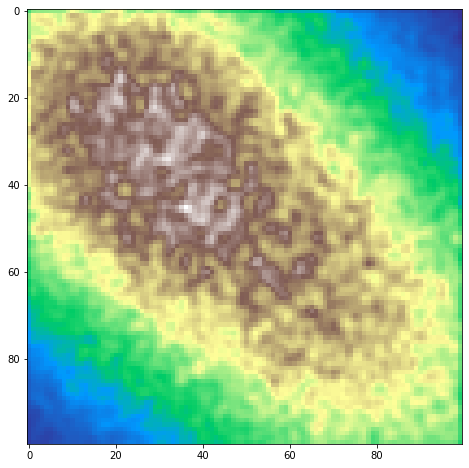

In [167]:
samples1 = np.random.multivariate_normal((1.7, 1.8), cov=np.eye(2), size=int(2.e6))
samples2 = np.random.multivariate_normal((0.4, 0.3), cov=np.eye(2), size=int(2.4e6))
# samples2 = np.random.multivariate_normal((3., 4.), cov=np.eye(2)*1, size=1800000)
# samples3 = np.random.multivariate_normal((4.5, 1.8), cov=np.eye(2), size=1100000)
# samples4 = np.random.multivariate_normal((7, 3), cov=np.eye(2)*1.5, size=2000000)
samples = np.concatenate((samples1, samples2))

bins = np.linspace(0, 2, 104)

bcens = bins[:-1] + np.diff(bins) / 2
land = np.histogram2d(samples[:, 0], samples[:, 1], bins=(bins, bins), density=True)[0] * 4
land = convolve_map(land, 1, which="gauss")
land = land[1:-2, 1:-1]

lmax = land.max()
land = (land / lmax)**3. * lmax
land *= 3000

fig = plt.figure(figsize=(8, 8))
ax = fig.add_subplot(111)
plt.imshow(land, cmap=plt.cm.terrain)

In [168]:
zland = ndimage.zoom(land, 2)

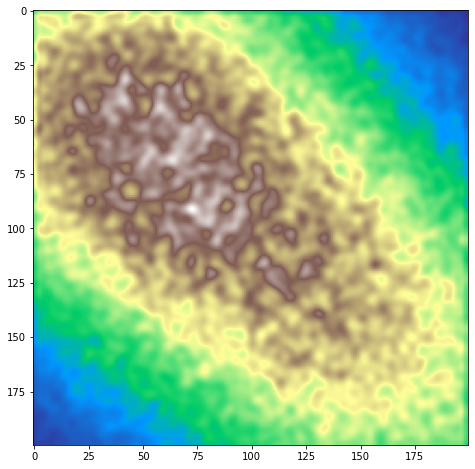

In [169]:
fig = plt.figure(figsize=(8, 8))
ax = fig.add_subplot(111)
plt.imshow(zland, cmap=plt.cm.terrain)

In [170]:
land.min()

125.07444361237111

# Erosion model of the mountain side

In [171]:
def calc_shifted(inmap):
    """shift up, down, left, right"""

    omap = []
    tmp = np.roll(inmap, -1, axis=0)
    tmp[-1:, :] = 0
    omap.append(tmp)

    tmp = np.roll(inmap, 1, axis=0)
    tmp[:1, :] = 0
    omap.append(tmp)

    tmp = np.roll(inmap, -1, axis=1)
    tmp[:, -1:] = 0
    omap.append(tmp)        

    tmp = np.roll(inmap, 1, axis=1)
    tmp[:, :1] = 0
    omap.append(tmp)     
    return np.array(omap)   

def calc_unshifted(inmap):
    omap = []

    tmp = np.roll(inmap[0, :, :], 1, axis=0)
    tmp[:1, :] = 0
    omap.append(tmp)

    tmp = np.roll(inmap[1, :, :], -1, axis=0)
    tmp[-1:, :] = 0
    omap.append(tmp)

    tmp = np.roll(inmap[2, :, :], 1, axis=1)
    tmp[:, :1] = 0
    omap.append(tmp)     

    tmp = np.roll(inmap[3, :, :], -1, axis=1)
    tmp[:, -1:] = 0
    omap.append(tmp)        

    return np.array(omap)

def center_cut(arr):
    return arr[1:-1, 1:-1]

def null_edges(arr):
    arr[0, :] = 0.
    arr[:, 0] = 0.
    arr[:, -1] = 0.
    arr[-1, :] = 0.
    return arr

In [172]:
def pad(canvases):
    """padsfor each canvas pad the 2d array"""
    keys = canvases.keys()
    padded_canvases = {}
    for key in keys:
        arr = canvases[key]
        arr = np.pad(arr, pad_width=1, mode="edge")
        padded_canvases.update({key: arr})
    return padded_canvases

class CellSpace(object):
    def __init__(self, initial_maps, rules):
        """
        Cell automata, considers the direct neighbor cells only
        
        Initialize with a dict of initial maps in the style
        
        initial_maps = {
            "layer_name": initial map,
        }
        
        The rules are a similar dictionary of class instances which will be passed 
        
        
        """
        self.canvases = copy.deepcopy(initial_maps)
        self.layers = list(initial_maps.keys())
        self.padded_canvases = pad(self.canvases)

        self.shape_canvas = self.canvases[self.layers[0]].shape
        self.shape_canvas_padded = self.padded_canvases[self.layers[0]].shape
    
        self.imap = np.arange(len(self.canvases[self.layers[0]].flatten())).reshape(self.shape_canvas)
        self.imap_padded = np.arange(len(self.padded_canvases[self.layers[0]].flatten())).reshape(self.shape_canvas_padded)
        self.imap_center = center_cut(self.imap_padded)
        self.imap_shifted = [center_cut(tmp) for tmp in calc_shifted(self.imap_padded)]
        self.imap_unshifted = [
            self.imap_shifted[1],
            self.imap_shifted[0],
            self.imap_shifted[3],
            self.imap_shifted[2],
        ]
        
        self.shifted_canvases = self.shift()
        self.rules = rules
        
        self.maps = {}
        self.reset_maps()
            
    def update_maps(self):
        for key in self.layers:
            self.maps[key].append(self.canvases[key].copy())
            
    def reset_maps(self):
        self.maps = {}
        for key in self.layers:
#             dd = {key: [self.canvases[key],]}
            dd = {key: []}
            self.maps.update(dd)            
       
    def shift(self):
        shifted_canvases = {}
        for key in self.canvases.keys():
            arr = np.array([self.padded_canvases[key].flat[ii] for ii in self.imap_shifted])
            shifted_canvases.update({key: arr})
        return shifted_canvases
            
            
    def step(self):
        
        new_canvases = {}
        for rule in self.rules:
            canvas = rule.evolve(self)
            new_canvases.update(canvas)
            
        self.canvases = new_canvases
        self.padded_canvases = pad(self.canvases)
        self.shifted_canvases = self.shift()


    def flow(self, nstep=100, savestep=5):
        """
        a series of steps
        """
        self.reset_maps()
        self.update_maps()
        for i in np.arange(nstep):
#             print(str(i) + ' out of ' + str(nstep-1), end="\r")
            print(str(i) + ' out of ' + str(nstep-1), end="\n")
            self.step()
            if i % savestep == 0:
                self.update_maps()

In [173]:
class FlowRule(object):
    def __init__(self, flow_factor=0.5):
        """
        The way this automata is set up is with a walled boundary condition, matter can flow to the edges, but not out of it
        Therefore matter is conserved in the canvas. That's good
        
        An erosion factor of 1 makes a really unstable checkerboard behaviour, use smaller values for a balanced behaviour,
        """
        self.layers = np.sort(("terrain",))
        self.key = "terrain"
#         self.needed_keys ["terrain",]
        if flow_factor >= 1:
            raise ValueError("flow_factor must be less than 1, current value is {:.3f}".format(flow_factor))
        self.flow_factor = flow_factor
        
    def evolve(self, cell):
        height_local = cell.canvases[self.key]
        height_shifted = cell.shifted_canvases[self.key]
        
        diffs = height_local - height_shifted
#         diffs[diffs < 0] = 0
        diffs[diffs < diffs.max(axis=0)] = 0. 
#         fractions = np.nan_to_num(diffs / diffs.sum(axis=0))
        
        outflow = diffs * self.flow_factor # this is the outgoing amount
#         print(outflow)
        height_local = self.calc_flows(height_local, outflow, cell)
        resdict = cell.canvases
        resdict.update({self.key: height_local})
        return resdict

    def _calc_flows(self, vmap, outflow, cell):
        shifted_landslide = [] 
        for i, ii in enumerate(cell.imap_unshifted):
            # the padding here is what restricts the landslide to the frozen boundary condition
            tmp = np.pad(outflow[i], pad_width=1, mode="constant", constant_values=0)
            tmp = tmp.flat[ii]
            shifted_landslide.append(tmp)
        shifted_landslide = np.array(shifted_landslide)
        return shifted_landslide.sum(axis=0)
    
    def calc_flows(self, vmap, outflow, cell):
        vmap -= outflow.sum(axis=0)
        vmap += self._calc_flows(vmap, outflow, cell)
        return vmap
         
        
class RainFall(FlowRule):
    def __init__(self, rainfall=1, fraction=0.2, seed=10):
        """
        This is adds new rain water to the water canvas
    
        """
        self.layers = np.sort(("water",))
        self.key = "water"
        self.rainfall = rainfall
        self.fraction = fraction
        self.rng = np.random.RandomState(seed)
        
    def evolve(self,  cell):
        water_local = cell.canvases[self.key]
        
        rmax = 100
        rpiv = rmax * (1 - self.fraction)
        rainmap = np.random.random(size=water_local.shape) * rmax
        rainmap[rainmap <= rpiv] = 0.
        rainmap[rainmap > rpiv] = self.rainfall
        
        water_local += rainmap
        
        resdict = cell.canvases
        resdict.update({self.key: water_local})
        return resdict               
        


In [174]:
arr = np.linspace(0, 5000, 100)

In [175]:
def temperature(vals, h2k=3000, temperature_2k=0., temperature0=20):
    res = (temperature_2k - temperature0) / h2k * vals + temperature0
    return res

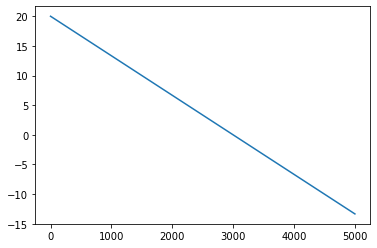

In [176]:
plt.plot(arr, temperature(arr))

In [220]:
   
class IceWaterGravelFlow(FlowRule):
    def __init__(self, altitude=10000, water_flow_rate=0.5, land_coerosion_rate=0.1,
                 drag_coeff=0.1, gravel_factor=4, flow_limit=10.,
                 ice_fracturing_rate=0.1, ice_melt_rate=0.05, ice_melt_min=10, ice_flow_rate=0.05,
                 temperature0=24, temperature_2k=0, h2k=3000.
                ):
        """
        This is a four component erosion model with glaciers
        
        This is a three component erosion model where water flows fast, and drags a fraction of the land with it
        Any land once dragged, will becone gravel, which erodes very easily
        
        wflow_rate is the water flaw per time step
        lflow rate is the land coerosion per time step, this should be much smaller than the water flow rate
        gravel_factor is the multiplier to the land coerosion rate
        
        The local gradient step is determined by the total land plus water height,
        and each component is dragged separately
        
        this is the lazy river approximation, where the velocity of water is negligible. Perhaps this is a mistake
        
        """
        self.layers = np.sort(("rock", "gravel" , "water", "ice", "temperature"))
        self.wkey = "water"
        self.lkey = "rock"
        self.gkey = "gravel"
        self.ikey = "ice"
        self.tkey = "temperature"
        self.water_flow_rate = water_flow_rate
        self.land_coerosion_rate = land_coerosion_rate
        self.drag_coeff = drag_coeff
        self.gravel_factor = gravel_factor
        self.ice_fracturing_rate = ice_fracturing_rate
        self.ice_melt_rate = ice_melt_rate
        self.ice_melt_min = ice_melt_min
        self.ice_flow_rate = ice_flow_rate
        self.altitude = altitude
        
        self.temperature0 = temperature0
        self.temperature_2k = temperature_2k
        self.h2k = h2k
        
    def get_temperature_map(self, height_local):
        res = (self.temperature_2k - self.temperature0) / self.h2k * height_local + self.temperature0
#         print(res)
        return res
    
    
    def freezing(self, ice, temp, water):
        """
        This is actually melting and freezing melting is negative freezing
        
        Ice has some time to melt, and to freeze,
        this is a self similar proportional process, with a minimum cutoff step
        """
        
        meltwater = np.zeros(ice.shape)
        newice = np.zeros(ice.shape)
        
        imelt = np.where(temp > 0)
        ifreeze = np.where(temp < 0)
#         print(temp[imelt].mean())
#         print(temp[ifreeze].mean())
        
        meltwater[imelt] = ice[imelt] * self.ice_melt_rate
        ii = np.where(meltwater[imelt] < self.ice_melt_min)
        meltwater[imelt][ii] = ice[imelt][ii] # this cuts off the iteration process for melting graciers
        
        newice[ifreeze] = water[ifreeze] * self.ice_melt_rate
        ii = np.where(newice[ifreeze] < self.ice_melt_min)
        newice[ifreeze][ii] = water[ifreeze][ii] # this cuts off the iteration process for freezing glaciers        
        
        # This is just a two field component continuity equation
        ice += (newice - meltwater)
        water -= (newice - meltwater)
        
        ii = ice > 0
        print(temp[ii].mean())
        return ice, water
        
                
    def evolve(self, cell):
        """
        It is interesting that the outflow direction is set by land + gravel,
        but the amount of drag possible is two
        """
#         np.set_printoptions(suppress=True)

        # these are the only canvases we are going to care about at all
        rock_local = cell.canvases[self.lkey]
        rock_shifted = cell.shifted_canvases[self.lkey]
        
        gravel_local = cell.canvases[self.gkey]
        gravel_shifted = cell.shifted_canvases[self.gkey]
        
        water_local = cell.canvases[self.wkey]
        ice_local = cell.canvases[self.ikey]
        
        temp_height_local = rock_local + gravel_local
        temp_local = self.get_temperature_map(temp_height_local) # temperature is static, it matter locally only
        ice_local, water_local = self.freezing(ice_local, temp_local, water_local)
        
        water_shifted = cell.shifted_canvases[self.wkey]
        ice_shifted = cell.shifted_canvases[self.ikey]
        
        height_local = rock_local + gravel_local + water_local + ice_local
        height_shifted = rock_shifted + gravel_shifted + water_shifted + ice_shifted

        # 1) water flows along the gradient
        diffs = height_local - height_shifted
        diffs[diffs < 0] = 0
        fractions = np.nan_to_num(diffs / diffs.sum(axis=0))
        outflow_w = water_local * fractions * self.water_flow_rate
        water_local = self.calc_flows(water_local, outflow_w, cell)
        water_local = null_edges(water_local) # This models the part where water flows out of the canvas
        # no more land can outflow than there is difference
        # Due to the megaoutflow approximation, the water height can be VERY high, this means we need to rationalize
        # The amount of land drag possible to an actual sensible maximum
        
        # The rock must only eroded if there is no more gravel left... This is a really curious nonlinearity
        
        # 2) the gravel flows
        gflow_limit = np.sqrt(gravel_local) * self.drag_coeff * self.gravel_factor
        ii = np.where(gflow_limit > 0.1 * gravel_local)
        gflow_limit[ii] = 0.1 * gravel_local[ii]        
        gflow_limit = np.array([gflow_limit, ] * 4) / 4.
        outflow_g = outflow_w * self.land_coerosion_rate * self.gravel_factor
        ii = outflow_g > (gflow_limit)
        outflow_g[ii] = gflow_limit[ii]        
        gravel_local = self.calc_flows(gravel_local, outflow_g, cell)

        # and now we tag on glaciers to erode the bedrock into gravel, and flow
        outflow_i = ice_local * fractions * self.ice_flow_rate
        ice_local = self.calc_flows(ice_local, outflow_i, cell)
        ice_local = null_edges(ice_local)       # a glacier simply flows out of the frame and goes away to the distance 
        
        # 3) The rock erodes from water and ice flow
        # we have to establish the local gravel coverage
        # The rock is eroded into gravel by the flow of water and ice
        lflow_limit = np.sqrt(rock_local) * self.drag_coeff
        ii = np.where(lflow_limit > 0.1 * rock_local)
        lflow_limit[ii] = 0.1 * rock_local[ii]
        ii = np.where(gravel_local > 0)
        lflow_limit[ii] = 0. # This means the rock will never erode if its covered by gravel,
        # the gravel has to flow away first in order to occur
        lflow_limit = np.array([lflow_limit, ] * 4) / 4.
#         lflow_limit = np.array([rock_local * self.drag_coeff,] * 4) / 4 # limit how much land can be dragged at each point
        
        # in megaoutflow, water can pile up really high, this must be regularized
        outflow_l = outflow_w * self.land_coerosion_rate # this is water
        outflow_l += outflow_i * self.ice_fracturing_rate # This is ice
        ii = outflow_l > (lflow_limit)
        outflow_l[ii] = lflow_limit[ii]        
        
        rock_local -= outflow_l.sum(axis=0)    
        gravel_local += self._calc_flows(gravel_local, outflow_l, cell)
        

        resdict = cell.canvases
        resdict.update({self.wkey: water_local, self.lkey: rock_local, self.gkey: gravel_local,
                        self.ikey: ice_local, self.tkey: temp_local})
        
#         np.set_printoptions(suppress=False)
        return resdict    


In [249]:
rules = (
    RainFall(rainfall=0.1, fraction=0.2),
    IceWaterGravelFlow(land_coerosion_rate=0.05, water_flow_rate=0.9, drag_coeff=4, gravel_factor=10,
                       ice_fracturing_rate=0.2, ice_melt_rate=0.3, ice_melt_min=40, ice_flow_rate=0.05,
                       temperature0=20, temperature_2k=0, h2k=2000
                  ),
)
wmap = np.zeros(shape=zland.shape)
gmap = np.zeros(shape=zland.shape)
imap = np.zeros(shape=zland.shape)
tmap = np.zeros(shape=zland.shape) + 20.
initial_maps = {
    "rock": null_edges(zland * 0.8),
    "gravel": null_edges(zland * 0.2),
    "water": null_edges(wmap),
    "ice": null_edges(imap),
    "temperature": null_edges(tmap),
}

In [260]:
cs = CellSpace(initial_maps, rules)
cs.flow(8000, savestep=100)

all_rock = copy.deepcopy(cs.maps["rock"])
all_gravel = copy.deepcopy(cs.maps["gravel"])
all_waters = copy.deepcopy(cs.maps["water"])
all_ice = copy.deepcopy(cs.maps["ice"])
all_temperature = copy.deepcopy(cs.maps["temperature"])

0 out of 7999
-12.222965921743942
1 out of 7999
-11.923143072091197
2 out of 7999
-11.56458172170045
3 out of 7999
-11.158158891008322
4 out of 7999
-10.751727767297764
5 out of 7999
-10.394646930933042
6 out of 7999
-10.113353793926397
7 out of 7999
-9.90190964982682
8 out of 7999
-9.738683061694955
9 out of 7999
-9.601948211223894
10 out of 7999
-9.495086902835741
11 out of 7999
-9.414931853772917
12 out of 7999
-9.351939552858497
13 out of 7999
-9.296572369098856
14 out of 7999
-9.251432251392913
15 out of 7999
-9.211110601498536


/tmp/ipykernel_4431/742741672.py:112: RuntimeWarning: invalid value encountered in true_divide
  fractions = np.nan_to_num(diffs / diffs.sum(axis=0))


16 out of 7999
-9.175118753846286
17 out of 7999
-9.138213473575554
18 out of 7999
-9.101128765695131
19 out of 7999
-9.066759030395783
20 out of 7999
-9.032730520603005
21 out of 7999
-8.997975859669229
22 out of 7999
-8.962480435946592
23 out of 7999
-8.921562151585228
24 out of 7999
-8.889654139391105
25 out of 7999
-8.862255409692235
26 out of 7999
-8.834877478118118
27 out of 7999
-8.806582762498063
28 out of 7999
-8.77960021613433
29 out of 7999
-8.752585889451595
30 out of 7999
-8.730990374644751
31 out of 7999
-8.705147538036146
32 out of 7999
-8.67914225681335
33 out of 7999
-8.652698405620761
34 out of 7999
-8.626030130998698
35 out of 7999
-8.60302404170401
36 out of 7999
-8.584875946930277
37 out of 7999
-8.571944298424173
38 out of 7999
-8.555380852558477
39 out of 7999
-8.536996895313504
40 out of 7999
-8.51505275586308
41 out of 7999
-8.496071544059436
42 out of 7999
-8.476097989526215
43 out of 7999
-8.459977580216435
44 out of 7999
-8.442445956078341
45 out of 7999
-8.

257 out of 7999
-5.95995416457809
258 out of 7999
-5.954966654275233
259 out of 7999
-5.9459718555586605
260 out of 7999
-5.935400341432135
261 out of 7999
-5.92432710287234
262 out of 7999
-5.909893336237592
263 out of 7999
-5.892440391901714
264 out of 7999
-5.872103509204424
265 out of 7999
-5.851450304791093
266 out of 7999
-5.830789823857949
267 out of 7999
-5.8110449359015774
268 out of 7999
-5.790709524108103
269 out of 7999
-5.7674018795797
270 out of 7999
-5.74388090792324
271 out of 7999
-5.723192464936994
272 out of 7999
-5.702688088025898
273 out of 7999
-5.682324371284942
274 out of 7999
-5.66365029799938
275 out of 7999
-5.646318290887923
276 out of 7999
-5.629509186468901
277 out of 7999
-5.609673549586185
278 out of 7999
-5.5867565695467585
279 out of 7999
-5.563859395211595
280 out of 7999
-5.537934324598531
281 out of 7999
-5.510359858874827
282 out of 7999
-5.478496334922921
283 out of 7999
-5.445511007185809
284 out of 7999
-5.412174847330381
285 out of 7999
-5.3814

496 out of 7999
-1.1592787951890364
497 out of 7999
-1.1562820249622643
498 out of 7999
-1.1528629247121032
499 out of 7999
-1.148854914905628
500 out of 7999
-1.1434851360883644
501 out of 7999
-1.139170056439739
502 out of 7999
-1.1342017626664629
503 out of 7999
-1.1289990401242973
504 out of 7999
-1.1229101230111966
505 out of 7999
-1.1173561328852386
506 out of 7999
-1.1105758205747842
507 out of 7999
-1.1033862201841151
508 out of 7999
-1.096137215480195
509 out of 7999
-1.0892792229011068
510 out of 7999
-1.0831114262723296
511 out of 7999
-1.077397751920769
512 out of 7999
-1.0717255873836227
513 out of 7999
-1.0652083047701277
514 out of 7999
-1.0586771071008894
515 out of 7999
-1.050617025842232
516 out of 7999
-1.0424440788542775
517 out of 7999
-1.0340817454661602
518 out of 7999
-1.0275289030984363
519 out of 7999
-1.021764465466676
520 out of 7999
-1.0183606920492572
521 out of 7999
-1.0140486210130872
522 out of 7999
-1.008986364599975
523 out of 7999
-1.0047111180234904

733 out of 7999
-0.5822195679081266
734 out of 7999
-0.5823359953105645
735 out of 7999
-0.5825259378315096
736 out of 7999
-0.5824399320420427
737 out of 7999
-0.5813574948808792
738 out of 7999
-0.580775711061889
739 out of 7999
-0.5807610847561049
740 out of 7999
-0.5803993067534506
741 out of 7999
-0.5789862785218636
742 out of 7999
-0.5785347156687994
743 out of 7999
-0.5782195447245797
744 out of 7999
-0.5773978494461856
745 out of 7999
-0.5766331415546058
746 out of 7999
-0.5762420205398245
747 out of 7999
-0.5755695381899899
748 out of 7999
-0.57543154933515
749 out of 7999
-0.5749546943491368
750 out of 7999
-0.5749423025069202
751 out of 7999
-0.57447047952576
752 out of 7999
-0.5730429402960533
753 out of 7999
-0.5719050285563797
754 out of 7999
-0.5724249288392143
755 out of 7999
-0.5724359360789077
756 out of 7999
-0.5723558622970714
757 out of 7999
-0.5725864242775166
758 out of 7999
-0.572716563245039
759 out of 7999
-0.5729016791865978
760 out of 7999
-0.573782079700309

972 out of 7999
-0.10844448050402179
973 out of 7999
-0.1056371879151027
974 out of 7999
-0.10322984846854624
975 out of 7999
-0.10043162028162869
976 out of 7999
-0.09763921632749915
977 out of 7999
-0.09649495589283301
978 out of 7999
-0.0956695913799722
979 out of 7999
-0.09449073990825238
980 out of 7999
-0.09355090431338797
981 out of 7999
-0.09300981632266632
982 out of 7999
-0.09129618684469656
983 out of 7999
-0.0902149704246269
984 out of 7999
-0.08935320825680128
985 out of 7999
-0.08845454466645072
986 out of 7999
-0.08790284646688332
987 out of 7999
-0.08819496865511896
988 out of 7999
-0.08794412853692843
989 out of 7999
-0.08736043033909208
990 out of 7999
-0.08722960562750197
991 out of 7999
-0.08681510279388954
992 out of 7999
-0.08637433056132307
993 out of 7999
-0.08653396830966353
994 out of 7999
-0.08634994383012659
995 out of 7999
-0.08653761177685357
996 out of 7999
-0.08651290396040848
997 out of 7999
-0.08656461853973342
998 out of 7999
-0.08662930219761515
999 

1194 out of 7999
0.014749613671614719
1195 out of 7999
0.014999664074551528
1196 out of 7999
0.014819844705720177
1197 out of 7999
0.014954931252517071
1198 out of 7999
0.01551324593967551
1199 out of 7999
0.016371939432983866
1200 out of 7999
0.01670732931177459
1201 out of 7999
0.017828506163913026
1202 out of 7999
0.018545894194464414
1203 out of 7999
0.019083149338644665
1204 out of 7999
0.019648664658935312
1205 out of 7999
0.02014186453292059
1206 out of 7999
0.021845218818376623
1207 out of 7999
0.023238881183055
1208 out of 7999
0.02488411110685767
1209 out of 7999
0.027136190968059054
1210 out of 7999
0.028980399610255475
1211 out of 7999
0.031622223259613676
1212 out of 7999
0.034626626848338615
1213 out of 7999
0.03720758448368708
1214 out of 7999
0.04021697248300214
1215 out of 7999
0.042632287949400986
1216 out of 7999
0.04501871177329286
1217 out of 7999
0.04745371731161942
1218 out of 7999
0.049595215800097556
1219 out of 7999
0.05187227863246714
1220 out of 7999
0.05325

1429 out of 7999
0.1326885399060605
1430 out of 7999
0.13319040508357896
1431 out of 7999
0.1340875393263093
1432 out of 7999
0.1354806538302492
1433 out of 7999
0.13553771998271563
1434 out of 7999
0.13612157074935688
1435 out of 7999
0.1364332278288325
1436 out of 7999
0.13645541741085915
1437 out of 7999
0.1364828776171675
1438 out of 7999
0.1365996979193888
1439 out of 7999
0.13677964064196568
1440 out of 7999
0.1368164905408135
1441 out of 7999
0.13678762887254575
1442 out of 7999
0.13680907550708188
1443 out of 7999
0.13683509674190072
1444 out of 7999
0.13640111767741742
1445 out of 7999
0.13623997882476407
1446 out of 7999
0.13610129418006123
1447 out of 7999
0.136492850824401
1448 out of 7999
0.1366753200763136
1449 out of 7999
0.13692840360830344
1450 out of 7999
0.13718913250754913
1451 out of 7999
0.13760749180514104
1452 out of 7999
0.1376287965102466
1453 out of 7999
0.13765097877444968
1454 out of 7999
0.1376705436791608
1455 out of 7999
0.13780131819699012
1456 out of 7

1653 out of 7999
0.1730746063418624
1654 out of 7999
0.17423349163390578
1655 out of 7999
0.17434609001219822
1656 out of 7999
0.1740773776166829
1657 out of 7999
0.1737843081256245
1658 out of 7999
0.17338801544619434
1659 out of 7999
0.17325393939525757
1660 out of 7999
0.17291152794093964
1661 out of 7999
0.17240036015393673
1662 out of 7999
0.17183156841144892
1663 out of 7999
0.1712783544174332
1664 out of 7999
0.17082070141818934
1665 out of 7999
0.1704085792026903
1666 out of 7999
0.16986631986792322
1667 out of 7999
0.16962483650132618
1668 out of 7999
0.1690693682798893
1669 out of 7999
0.1688601202095963
1670 out of 7999
0.16871358868300076
1671 out of 7999
0.16855984110842986
1672 out of 7999
0.16825777901535557
1673 out of 7999
0.1680320079531568
1674 out of 7999
0.16774221398282715
1675 out of 7999
0.1665605298811745
1676 out of 7999
0.16537563659377982
1677 out of 7999
0.16465398267626935
1678 out of 7999
0.16435283802820053
1679 out of 7999
0.16382847851941298
1680 out o

1878 out of 7999
0.18719603857606104
1879 out of 7999
0.18707025019640247
1880 out of 7999
0.18760484060203492
1881 out of 7999
0.18814959426750152
1882 out of 7999
0.18869065191663245
1883 out of 7999
0.18909456524613039
1884 out of 7999
0.18966187193116804
1885 out of 7999
0.18965973666012592
1886 out of 7999
0.18968386669180415
1887 out of 7999
0.1895523134054189
1888 out of 7999
0.18976797260418365
1889 out of 7999
0.1896791442441343
1890 out of 7999
0.18988167675997422
1891 out of 7999
0.1902864005621867
1892 out of 7999
0.19050627786111823
1893 out of 7999
0.1909195503678678
1894 out of 7999
0.1909439684185575
1895 out of 7999
0.19095134554245866
1896 out of 7999
0.19097608963863247
1897 out of 7999
0.191006415233885
1898 out of 7999
0.19102867673665455
1899 out of 7999
0.19093934071230886
1900 out of 7999
0.19067155406475936
1901 out of 7999
0.1904104527344179
1902 out of 7999
0.1901558375112611
1903 out of 7999
0.1899200219495922
1904 out of 7999
0.18987636782521192
1905 out of

2106 out of 7999
0.21191276053499936
2107 out of 7999
0.21193838193000347
2108 out of 7999
0.2118321551735104
2109 out of 7999
0.2117270711434659
2110 out of 7999
0.2117252274437871
2111 out of 7999
0.21222150582207824
2112 out of 7999
0.21272578252429758
2113 out of 7999
0.21256077839454945
2114 out of 7999
0.21240255837637703
2115 out of 7999
0.2122653183692307
2116 out of 7999
0.21235501005185808
2117 out of 7999
0.21238039636740377
2118 out of 7999
0.2124349878474303
2119 out of 7999
0.21232865975285217
2120 out of 7999
0.21222723025929746
2121 out of 7999
0.21214477370829468
2122 out of 7999
0.21209564000801726
2123 out of 7999
0.21151456978721295
2124 out of 7999
0.2120412060414411
2125 out of 7999
0.21206618307437367
2126 out of 7999
0.21199557582555598
2127 out of 7999
0.2120206172828609
2128 out of 7999
0.21226693949025116
2129 out of 7999
0.2125214856070562
2130 out of 7999
0.21254998177406134
2131 out of 7999
0.2127371083532035
2132 out of 7999
0.21276334194621885
2133 out o

2331 out of 7999
0.22080768135861634
2332 out of 7999
0.22083307464030405
2333 out of 7999
0.22086123432195176
2334 out of 7999
0.2208859984290234
2335 out of 7999
0.22091030588535593
2336 out of 7999
0.22078914064404542
2337 out of 7999
0.22081546205546998
2338 out of 7999
0.22093266307023066
2339 out of 7999
0.22105471220748868
2340 out of 7999
0.2215165648314471
2341 out of 7999
0.22154232880975272
2342 out of 7999
0.2215694068236736
2343 out of 7999
0.2215958867552627
2344 out of 7999
0.22205692199696214
2345 out of 7999
0.2220840887227717
2346 out of 7999
0.2221081997011338
2347 out of 7999
0.22213284663346525
2348 out of 7999
0.2221599288266468
2349 out of 7999
0.22218496971791057
2350 out of 7999
0.22233933420353374
2351 out of 7999
0.22236681832191924
2352 out of 7999
0.22256033710572015
2353 out of 7999
0.22258579873066994
2354 out of 7999
0.222470413376158
2355 out of 7999
0.22249507198394153
2356 out of 7999
0.22251942924103896
2357 out of 7999
0.22254543009057826
2358 out o

2568 out of 7999
0.22111947537653745
2569 out of 7999
0.22114682184722412
2570 out of 7999
0.22116653783671297
2571 out of 7999
0.22119329665413273
2572 out of 7999
0.2212118198124656
2573 out of 7999
0.22124014401695383
2574 out of 7999
0.2210761880857501
2575 out of 7999
0.22120501705470164
2576 out of 7999
0.2212272250605363
2577 out of 7999
0.22125490674852835
2578 out of 7999
0.221275709541806
2579 out of 7999
0.22130124443034963
2580 out of 7999
0.2213250456906614
2581 out of 7999
0.22135119356157926
2582 out of 7999
0.2213706432067423
2583 out of 7999
0.2214826526630393
2584 out of 7999
0.22131129649998038
2585 out of 7999
0.2211459902644954
2586 out of 7999
0.22117008437026348
2587 out of 7999
0.22119539420549705
2588 out of 7999
0.22121615153969115
2589 out of 7999
0.22124349509663435
2590 out of 7999
0.22126583679507142
2591 out of 7999
0.22120784676533742
2592 out of 7999
0.22161836402290822
2593 out of 7999
0.22157740492516537
2594 out of 7999
0.22135367496529929
2595 out o

2806 out of 7999
0.2435159396355204
2807 out of 7999
0.24362388337320146
2808 out of 7999
0.2436458418536432
2809 out of 7999
0.24366823284297479
2810 out of 7999
0.24368666310625595
2811 out of 7999
0.24371143704371262
2812 out of 7999
0.2437340088893795
2813 out of 7999
0.2438402516024395
2814 out of 7999
0.24394948560815025
2815 out of 7999
0.24446195997693304
2816 out of 7999
0.2448335617500955
2817 out of 7999
0.24541514821813964
2818 out of 7999
0.24556462434419563
2819 out of 7999
0.24572003273029228
2820 out of 7999
0.24587933833980358
2821 out of 7999
0.24604313630503805
2822 out of 7999
0.24606692020112653
2823 out of 7999
0.24608477984831612
2824 out of 7999
0.246109059427615
2825 out of 7999
0.24613310024052468
2826 out of 7999
0.24615317327574085
2827 out of 7999
0.2461742971205686
2828 out of 7999
0.24652088283450507
2829 out of 7999
0.2465410009715297
2830 out of 7999
0.2465656717583346
2831 out of 7999
0.24658453549759593
2832 out of 7999
0.24661036640896106
2833 out of

3043 out of 7999
0.2715541085334051
3044 out of 7999
0.2720327807569871
3045 out of 7999
0.27205696232939647
3046 out of 7999
0.272076251138596
3047 out of 7999
0.27246607171733583
3048 out of 7999
0.27300255707033655
3049 out of 7999
0.27392435162778805
3050 out of 7999
0.2745020730726933
3051 out of 7999
0.27438079978593927
3052 out of 7999
0.27453637121569285
3053 out of 7999
0.27441032611951366
3054 out of 7999
0.27442758286309626
3055 out of 7999
0.27445200959617305
3056 out of 7999
0.2744699345115482
3057 out of 7999
0.2744960440854508
3058 out of 7999
0.2745148820801976
3059 out of 7999
0.2744879700201593
3060 out of 7999
0.2744669207734727
3061 out of 7999
0.27438434814905904
3062 out of 7999
0.27440211137183107
3063 out of 7999
0.27442538371352343
3064 out of 7999
0.2742242390753168
3065 out of 7999
0.274250205622333
3066 out of 7999
0.27426906901444265
3067 out of 7999
0.27429205999797945
3068 out of 7999
0.2743105341546529
3069 out of 7999
0.2743336942396187
3070 out of 7999

3273 out of 7999
0.29528674486097356
3274 out of 7999
0.29558705600431195
3275 out of 7999
0.2958942910949006
3276 out of 7999
0.2963616973564879
3277 out of 7999
0.2963860750431155
3278 out of 7999
0.2964059332900135
3279 out of 7999
0.296430911270686
3280 out of 7999
0.296243088510318
3281 out of 7999
0.29591706479510155
3282 out of 7999
0.29579433927410137
3283 out of 7999
0.29582248077567724
3284 out of 7999
0.29584375260132406
3285 out of 7999
0.29586511659122267
3286 out of 7999
0.29588978957364115
3287 out of 7999
0.2962234709593635
3288 out of 7999
0.2962453480986195
3289 out of 7999
0.29609648281868056
3290 out of 7999
0.2961176177248343
3291 out of 7999
0.2961426157729996
3292 out of 7999
0.29616370094529815
3293 out of 7999
0.2967699273640442
3294 out of 7999
0.2967883339415756
3295 out of 7999
0.2972458438670825
3296 out of 7999
0.29770614562292225
3297 out of 7999
0.29803471952743754
3298 out of 7999
0.2983665707098554
3299 out of 7999
0.2986873228356862
3300 out of 7999
0

3502 out of 7999
0.32291853204436105
3503 out of 7999
0.3230017642481052
3504 out of 7999
0.3231617072685237
3505 out of 7999
0.3233874328923671
3506 out of 7999
0.32362966610744653
3507 out of 7999
0.32388848991464375
3508 out of 7999
0.3242013355395553
3509 out of 7999
0.3244464922345067
3510 out of 7999
0.32447113761394386
3511 out of 7999
0.32448787150895037
3512 out of 7999
0.324523692661621
3513 out of 7999
0.32454288362536504
3514 out of 7999
0.32456607262940784
3515 out of 7999
0.32458247962743036
3516 out of 7999
0.3250105295565942
3517 out of 7999
0.32502937223132755
3518 out of 7999
0.3250491822661841
3519 out of 7999
0.3252172221260479
3520 out of 7999
0.3252402325098268
3521 out of 7999
0.3252578475465493
3522 out of 7999
0.3252802246850066
3523 out of 7999
0.3256896385318674
3524 out of 7999
0.32652007117998555
3525 out of 7999
0.32721010997268846
3526 out of 7999
0.32765846921911945
3527 out of 7999
0.3281065869114392
3528 out of 7999
0.3285728852633421
3529 out of 7999


3737 out of 7999
0.33438007668711967
3738 out of 7999
0.33461676561757026
3739 out of 7999
0.33486776318506206
3740 out of 7999
0.33553106294321094
3741 out of 7999
0.3362294809539388
3742 out of 7999
0.3363757262721572
3743 out of 7999
0.3365515626437689
3744 out of 7999
0.3365654784195474
3745 out of 7999
0.33637432655521476
3746 out of 7999
0.3363903144941312
3747 out of 7999
0.3361564712161084
3748 out of 7999
0.3361732305080914
3749 out of 7999
0.33639785933997324
3750 out of 7999
0.3361914551483047
3751 out of 7999
0.33621007070073095
3752 out of 7999
0.3361877027361068
3753 out of 7999
0.3361730327872075
3754 out of 7999
0.33618815272291885
3755 out of 7999
0.33620783374035845
3756 out of 7999
0.3362268413037668
3757 out of 7999
0.33624835259153657
3758 out of 7999
0.3362638348103133
3759 out of 7999
0.33613533700951326
3760 out of 7999
0.33615013892087997
3761 out of 7999
0.33616974614080525
3762 out of 7999
0.33618772455266976
3763 out of 7999
0.33653886323463417
3764 out of 7

3973 out of 7999
0.3556411321775819
3974 out of 7999
0.3554841818619812
3975 out of 7999
0.3555036355726193
3976 out of 7999
0.3555208726947658
3977 out of 7999
0.35554008949985044
3978 out of 7999
0.35621166232447665
3979 out of 7999
0.3568889616541729
3980 out of 7999
0.35729890356338057
3981 out of 7999
0.3577178018983446
3982 out of 7999
0.35769014686546635
3983 out of 7999
0.35770966621111305
3984 out of 7999
0.35772505857118325
3985 out of 7999
0.35774390303810266
3986 out of 7999
0.357758265224295
3987 out of 7999
0.3577762722217379
3988 out of 7999
0.35779352667208963
3989 out of 7999
0.35781117362102294
3990 out of 7999
0.35782857804692475
3991 out of 7999
0.3578476480144366
3992 out of 7999
0.3578660162251941
3993 out of 7999
0.35816463149445366
3994 out of 7999
0.35884343095911503
3995 out of 7999
0.3588620256158923
3996 out of 7999
0.35881522498427404
3997 out of 7999
0.35877781679457216
3998 out of 7999
0.3592993317229512
3999 out of 7999
0.35954342997080374
4000 out of 79

4207 out of 7999
0.3794751629970806
4208 out of 7999
0.38002903972820407
4209 out of 7999
0.3809708545129615
4210 out of 7999
0.38127636080108684
4211 out of 7999
0.3816787295829909
4212 out of 7999
0.3816958163136419
4213 out of 7999
0.38192439635367764
4214 out of 7999
0.38194057686029065
4215 out of 7999
0.38195746973600403
4216 out of 7999
0.3820878103358195
4217 out of 7999
0.3822093775084855
4218 out of 7999
0.3822258475530434
4219 out of 7999
0.38224299699425185
4220 out of 7999
0.38232791969553226
4221 out of 7999
0.38234385605476473
4222 out of 7999
0.38236050283997935
4223 out of 7999
0.38237884170440406
4224 out of 7999
0.3823952985680473
4225 out of 7999
0.38241207895862905
4226 out of 7999
0.38265786784754424
4227 out of 7999
0.38267783284079115
4228 out of 7999
0.3826946713382414
4229 out of 7999
0.38271071375693727
4230 out of 7999
0.3829571718998587
4231 out of 7999
0.3832013005243225
4232 out of 7999
0.38321797829747856
4233 out of 7999
0.38323437332357924
4234 out of 

4437 out of 7999
0.409193395619538
4438 out of 7999
0.4093392133506671
4439 out of 7999
0.40949954027578017
4440 out of 7999
0.40967550513701045
4441 out of 7999
0.4099925511232874
4442 out of 7999
0.4102010305021579
4443 out of 7999
0.4103645643810456
4444 out of 7999
0.41037559299586573
4445 out of 7999
0.41039102194461297
4446 out of 7999
0.41046768796814026
4447 out of 7999
0.4105568979337308
4448 out of 7999
0.4106618281760068
4449 out of 7999
0.4106795009943264
4450 out of 7999
0.41069264669715017
4451 out of 7999
0.4107110197205845
4452 out of 7999
0.41072475141849846
4453 out of 7999
0.41074185601097046
4454 out of 7999
0.410718257274478
4455 out of 7999
0.4111425298287056
4456 out of 7999
0.4111556183830449
4457 out of 7999
0.4111727514598076
4458 out of 7999
0.41139970144328447
4459 out of 7999
0.41142048444651586
4460 out of 7999
0.41143293082728544
4461 out of 7999
0.4114521433988507
4462 out of 7999
0.41156497259147556
4463 out of 7999
0.41229909550123034
4464 out of 7999


4671 out of 7999
0.43089965315853823
4672 out of 7999
0.43091811107757255
4673 out of 7999
0.43093445452576035
4674 out of 7999
0.4309521482612065
4675 out of 7999
0.4309689104617909
4676 out of 7999
0.4309867027086072
4677 out of 7999
0.4310036199667343
4678 out of 7999
0.4313396532419314
4679 out of 7999
0.4313567014070364
4680 out of 7999
0.4316663925781451
4681 out of 7999
0.4316841213998969
4682 out of 7999
0.43170408791004145
4683 out of 7999
0.4317182176287983
4684 out of 7999
0.43173914654957357
4685 out of 7999
0.4317552286826001
4686 out of 7999
0.4317735559037852
4687 out of 7999
0.43178861767982796
4688 out of 7999
0.43180911701683533
4689 out of 7999
0.4318242373291787
4690 out of 7999
0.43184548228008857
4691 out of 7999
0.43186195924053894
4692 out of 7999
0.43188328699608297
4693 out of 7999
0.4319014382675173
4694 out of 7999
0.43238783148711385
4695 out of 7999
0.43240336445150335
4696 out of 7999
0.43269417558440637
4697 out of 7999
0.4327102986069163
4698 out of 799

4909 out of 7999
0.44625094980015273
4910 out of 7999
0.446267622302488
4911 out of 7999
0.4462810748664397
4912 out of 7999
0.44629655087093434
4913 out of 7999
0.44631164181947386
4914 out of 7999
0.4463270369323596
4915 out of 7999
0.4463416526771073
4916 out of 7999
0.44654395478224823
4917 out of 7999
0.4468118935024507
4918 out of 7999
0.447083701353927
4919 out of 7999
0.4473655233090955
4920 out of 7999
0.44767234283834967
4921 out of 7999
0.44802470378555437
4922 out of 7999
0.44834909185729577
4923 out of 7999
0.44836102894276153
4924 out of 7999
0.44837962549949684
4925 out of 7999
0.4486856951812366
4926 out of 7999
0.4489967220524801
4927 out of 7999
0.44901233108453886
4928 out of 7999
0.449032171236753
4929 out of 7999
0.4490443237058965
4930 out of 7999
0.4490622964015215
4931 out of 7999
0.44907635047274497
4932 out of 7999
0.44937982403719895
4933 out of 7999
0.4493721989265402
4934 out of 7999
0.4493898318273609
4935 out of 7999
0.44940476361668474
4936 out of 7999
0

5147 out of 7999
0.462633776578917
5148 out of 7999
0.4627449817652084
5149 out of 7999
0.4627602086669413
5150 out of 7999
0.4627735443464966
5151 out of 7999
0.4629963069884017
5152 out of 7999
0.4630098338587114
5153 out of 7999
0.46302472197828765
5154 out of 7999
0.4629434275364214
5155 out of 7999
0.46296102221020613
5156 out of 7999
0.46297305050157617
5157 out of 7999
0.4627710638429285
5158 out of 7999
0.4627853121361876
5159 out of 7999
0.4628011008951212
5160 out of 7999
0.4628176510725218
5161 out of 7999
0.4628317322167638
5162 out of 7999
0.46284549567621036
5163 out of 7999
0.46286182598745734
5164 out of 7999
0.4630902649968548
5165 out of 7999
0.462947555321458
5166 out of 7999
0.46296171731202224
5167 out of 7999
0.46297736100772213
5168 out of 7999
0.46299010412223834
5169 out of 7999
0.46300672959809513
5170 out of 7999
0.462833509962535
5171 out of 7999
0.4628510603765318
5172 out of 7999
0.46286736379466065
5173 out of 7999
0.46288397064911957
5174 out of 7999
0.4

5385 out of 7999
0.47200665521408525
5386 out of 7999
0.4723845247806096
5387 out of 7999
0.47239728686189497
5388 out of 7999
0.47234989615164424
5389 out of 7999
0.4722712169601817
5390 out of 7999
0.4721490793966785
5391 out of 7999
0.4720693054880756
5392 out of 7999
0.4719962587527
5393 out of 7999
0.47194721034295206
5394 out of 7999
0.4719584632269845
5395 out of 7999
0.4719739201663388
5396 out of 7999
0.47198550957000035
5397 out of 7999
0.47199907295427385
5398 out of 7999
0.47201080033866066
5399 out of 7999
0.47202383255345404
5400 out of 7999
0.4720354551122728
5401 out of 7999
0.47205039900575296
5402 out of 7999
0.47206252162460355
5403 out of 7999
0.4720742843430269
5404 out of 7999
0.4720856181540468
5405 out of 7999
0.47209865584256083
5406 out of 7999
0.47211117331753916
5407 out of 7999
0.47213776231098775
5408 out of 7999
0.47214240820603737
5409 out of 7999
0.47221590106844874
5410 out of 7999
0.47229200298321167
5411 out of 7999
0.4723030065645113
5412 out of 799

5621 out of 7999
0.4878261124880338
5622 out of 7999
0.4878351124394216
5623 out of 7999
0.4877792343002396
5624 out of 7999
0.4877885277781026
5625 out of 7999
0.48786481185843095
5626 out of 7999
0.48804881852815035
5627 out of 7999
0.48813451357782933
5628 out of 7999
0.4882242066143614
5629 out of 7999
0.4883333352541641
5630 out of 7999
0.48845124087454916
5631 out of 7999
0.48846449560395316
5632 out of 7999
0.48847352602675437
5633 out of 7999
0.48871068757447006
5634 out of 7999
0.48872007472558976
5635 out of 7999
0.488578983667086
5636 out of 7999
0.48877081089223645
5637 out of 7999
0.48878449262182866
5638 out of 7999
0.488793585392118
5639 out of 7999
0.4889434052017801
5640 out of 7999
0.4892311023521754
5641 out of 7999
0.48959466357700665
5642 out of 7999
0.4896031391113791
5643 out of 7999
0.4898756913011044
5644 out of 7999
0.4903410242091132
5645 out of 7999
0.4907616195344928
5646 out of 7999
0.49097325282739657
5647 out of 7999
0.4914139874002502
5648 out of 7999
0

5853 out of 7999
0.5073961746493398
5854 out of 7999
0.5074043785390967
5855 out of 7999
0.507417235616129
5856 out of 7999
0.5074244926521613
5857 out of 7999
0.5074365277893169
5858 out of 7999
0.507443174715051
5859 out of 7999
0.5075447953352223
5860 out of 7999
0.5078074256744254
5861 out of 7999
0.5078577312934996
5862 out of 7999
0.5078668727704608
5863 out of 7999
0.5078839253893119
5864 out of 7999
0.5078930938749687
5865 out of 7999
0.5081148726955422
5866 out of 7999
0.5081235009035756
5867 out of 7999
0.5082745152241703
5868 out of 7999
0.5084742591829484
5869 out of 7999
0.5084886626078354
5870 out of 7999
0.5084976585881713
5871 out of 7999
0.508511681489873
5872 out of 7999
0.5085200733790751
5873 out of 7999
0.5085337654206467
5874 out of 7999
0.5088045275979539
5875 out of 7999
0.5088210625029704
5876 out of 7999
0.5088303177374748
5877 out of 7999
0.5091236404007158
5878 out of 7999
0.509132972767246
5879 out of 7999
0.5091463948132327
5880 out of 7999
0.5091546827948

6084 out of 7999
0.5178174961274493
6085 out of 7999
0.5178307305757855
6086 out of 7999
0.51784248640772
6087 out of 7999
0.5178544251241937
6088 out of 7999
0.5178650299626073
6089 out of 7999
0.5181355422422347
6090 out of 7999
0.5184091519535668
6091 out of 7999
0.5183452687836517
6092 out of 7999
0.5183557385304876
6093 out of 7999
0.5183674040936092
6094 out of 7999
0.5183779331229725
6095 out of 7999
0.5183894565353178
6096 out of 7999
0.5183985349164012
6097 out of 7999
0.5184115143119712
6098 out of 7999
0.5184218584913005
6099 out of 7999
0.5184333259069087
6100 out of 7999
0.5186947966387129
6101 out of 7999
0.5189657582853442
6102 out of 7999
0.5192391676374327
6103 out of 7999
0.5192524351315292
6104 out of 7999
0.5192644775068024
6105 out of 7999
0.5192768004564894
6106 out of 7999
0.5192716033778532
6107 out of 7999
0.51928332285782
6108 out of 7999
0.5192936858986192
6109 out of 7999
0.5193074995623346
6110 out of 7999
0.519574018971216
6111 out of 7999
0.51958644470368

6322 out of 7999
0.5393291873338754
6323 out of 7999
0.5393405907151968
6324 out of 7999
0.5393486975561422
6325 out of 7999
0.5393612761358815
6326 out of 7999
0.539372139394415
6327 out of 7999
0.5394872108201698
6328 out of 7999
0.5394954036122253
6329 out of 7999
0.5395094261434784
6330 out of 7999
0.5395191915892779
6331 out of 7999
0.5395331154936959
6332 out of 7999
0.5397395218638361
6333 out of 7999
0.5397655918992785
6334 out of 7999
0.53977490996865
6335 out of 7999
0.5397851495607561
6336 out of 7999
0.5397798147076722
6337 out of 7999
0.5397916636686952
6338 out of 7999
0.5398015337586461
6339 out of 7999
0.5398127271704676
6340 out of 7999
0.5398236590051413
6341 out of 7999
0.5398351352430486
6342 out of 7999
0.5398455016087365
6343 out of 7999
0.5398557209533266
6344 out of 7999
0.5398650862788793
6345 out of 7999
0.5399903090573203
6346 out of 7999
0.540002826738556
6347 out of 7999
0.5402572453071365
6348 out of 7999
0.5407631474481037
6349 out of 7999
0.5412180141628

6558 out of 7999
0.5504156725782007
6559 out of 7999
0.5505834386895492
6560 out of 7999
0.55059324039235
6561 out of 7999
0.5506028589930474
6562 out of 7999
0.5506145812097838
6563 out of 7999
0.5506841149363529
6564 out of 7999
0.5507644042801322
6565 out of 7999
0.5508602778485661
6566 out of 7999
0.5513455886644977
6567 out of 7999
0.5514913007102317
6568 out of 7999
0.551666897244759
6569 out of 7999
0.551855329021735
6570 out of 7999
0.5520515137175986
6571 out of 7999
0.5520637041902853
6572 out of 7999
0.5522338615831545
6573 out of 7999
0.5522425653806207
6574 out of 7999
0.5522550195178471
6575 out of 7999
0.5522642844521659
6576 out of 7999
0.5522756309738752
6577 out of 7999
0.5521415261346257
6578 out of 7999
0.5521526315735271
6579 out of 7999
0.5521619190439765
6580 out of 7999
0.5521754276680407
6581 out of 7999
0.5521860628308949
6582 out of 7999
0.55219782512852
6583 out of 7999
0.5522069065768694
6584 out of 7999
0.5522179067037571
6585 out of 7999
0.552225796220055

6787 out of 7999
0.5592691428135411
6788 out of 7999
0.5592806791203747
6789 out of 7999
0.5592893903975131
6790 out of 7999
0.559302478968894
6791 out of 7999
0.5593116589595278
6792 out of 7999
0.5593245098457151
6793 out of 7999
0.5593368926333342
6794 out of 7999
0.5593498083116428
6795 out of 7999
0.5593698240371276
6796 out of 7999
0.5593832063817775
6797 out of 7999
0.5593912404635942
6798 out of 7999
0.5594021277173957
6799 out of 7999
0.5594135177595358
6800 out of 7999
0.5594254785779799
6801 out of 7999
0.5594639408003712
6802 out of 7999
0.5594768417077816
6803 out of 7999
0.5595945758012064
6804 out of 7999
0.559837310649411
6805 out of 7999
0.5598492405570853
6806 out of 7999
0.5598623540292964
6807 out of 7999
0.5598707140010496
6808 out of 7999
0.5598839852345449
6809 out of 7999
0.559895574394987
6810 out of 7999
0.5599080580166553
6811 out of 7999
0.5599187970982756
6812 out of 7999
0.5599295563205825
6813 out of 7999
0.5601562607809172
6814 out of 7999
0.560169424496

7027 out of 7999
0.5681372797694574
7028 out of 7999
0.5681458482342321
7029 out of 7999
0.5682363841321473
7030 out of 7999
0.5682874664591453
7031 out of 7999
0.5682993163677844
7032 out of 7999
0.5683065447954768
7033 out of 7999
0.5683151133892926
7034 out of 7999
0.5683234308282302
7035 out of 7999
0.5683328206603464
7036 out of 7999
0.5683562551442566
7037 out of 7999
0.5683645711721196
7038 out of 7999
0.5683749045232451
7039 out of 7999
0.5683858672704883
7040 out of 7999
0.5683950051474805
7041 out of 7999
0.5684064818786978
7042 out of 7999
0.5684159218794149
7043 out of 7999
0.5684256831757304
7044 out of 7999
0.5684347946443065
7045 out of 7999
0.5684446542704156
7046 out of 7999
0.5684532954608127
7047 out of 7999
0.5684630201477039
7048 out of 7999
0.5684750159261619
7049 out of 7999
0.5684832486557156
7050 out of 7999
0.5684921898142078
7051 out of 7999
0.5685020938559149
7052 out of 7999
0.5687234903669269
7053 out of 7999
0.5689416773052056
7054 out of 7999
0.568951703

7266 out of 7999
0.5797095203382999
7267 out of 7999
0.5797226844116256
7268 out of 7999
0.5797290397757963
7269 out of 7999
0.5797416324831752
7270 out of 7999
0.5797481513062961
7271 out of 7999
0.5798672148776643
7272 out of 7999
0.580104638681295
7273 out of 7999
0.5803309530142937
7274 out of 7999
0.5805578498640247
7275 out of 7999
0.5810207319983826
7276 out of 7999
0.5812504719178387
7277 out of 7999
0.581250469165911
7278 out of 7999
0.5812574520998007
7279 out of 7999
0.5812679521699406
7280 out of 7999
0.5812761425738212
7281 out of 7999
0.5812880768807802
7282 out of 7999
0.5812959320872011
7283 out of 7999
0.5813087709308989
7284 out of 7999
0.5813154608877242
7285 out of 7999
0.5815841319982493
7286 out of 7999
0.5815909768693567
7287 out of 7999
0.5816039843728363
7288 out of 7999
0.581693424638026
7289 out of 7999
0.5817045046458895
7290 out of 7999
0.58171293302229
7291 out of 7999
0.5817248785095606
7292 out of 7999
0.5817322930990068
7293 out of 7999
0.58174229844989

7504 out of 7999
0.5886225586456755
7505 out of 7999
0.5886321243345467
7506 out of 7999
0.5886342538438828
7507 out of 7999
0.5886442704970865
7508 out of 7999
0.5886997703299167
7509 out of 7999
0.5887091314228146
7510 out of 7999
0.5887126065281725
7511 out of 7999
0.5887234297513277
7512 out of 7999
0.5889377989546554
7513 out of 7999
0.5889465087273866
7514 out of 7999
0.5889509742127902
7515 out of 7999
0.5889591468303684
7516 out of 7999
0.5889614213950198
7517 out of 7999
0.5889716472717669
7518 out of 7999
0.588919205557889
7519 out of 7999
0.5888731116236435
7520 out of 7999
0.5888774089252328
7521 out of 7999
0.5888858729800395
7522 out of 7999
0.5888891400400018
7523 out of 7999
0.5888985088360084
7524 out of 7999
0.5888997637710428
7525 out of 7999
0.5889096474686054
7526 out of 7999
0.5889125550601492
7527 out of 7999
0.5889206968137357
7528 out of 7999
0.5889224226838843
7529 out of 7999
0.5889307066717315
7530 out of 7999
0.5890129752667265
7531 out of 7999
0.5891061622

7744 out of 7999
0.5983071889287107
7745 out of 7999
0.5983150445432646
7746 out of 7999
0.5983206756113999
7747 out of 7999
0.598521906318292
7748 out of 7999
0.598525747211412
7749 out of 7999
0.5985340532229199
7750 out of 7999
0.598533585369795
7751 out of 7999
0.5985412705755447
7752 out of 7999
0.5985444665350699
7753 out of 7999
0.5985502429829193
7754 out of 7999
0.5985554124574997
7755 out of 7999
0.598561314329019
7756 out of 7999
0.5985649863653641
7757 out of 7999
0.5985709268030651
7758 out of 7999
0.5986628997653468
7759 out of 7999
0.5986691297412626
7760 out of 7999
0.598671220669299
7761 out of 7999
0.5986772582883992
7762 out of 7999
0.5985018495024103
7763 out of 7999
0.5985065267404434
7764 out of 7999
0.5985080909990931
7765 out of 7999
0.598749032822354
7766 out of 7999
0.5987522370958304
7767 out of 7999
0.598669269295056
7768 out of 7999
0.5986717881455286
7769 out of 7999
0.5986776055604183
7770 out of 7999
0.5986798138086791
7771 out of 7999
0.5986856639164775

7984 out of 7999
0.6049186920023768
7985 out of 7999
0.6049236818389481
7986 out of 7999
0.6049535740710843
7987 out of 7999
0.6049572751031252
7988 out of 7999
0.6049599025044422
7989 out of 7999
0.6049647053458138
7990 out of 7999
0.6049673235090974
7991 out of 7999
0.6049727512265355
7992 out of 7999
0.604975665814413
7993 out of 7999
0.6049797707545844
7994 out of 7999
0.6049836361727461
7995 out of 7999
0.6050365914605937
7996 out of 7999
0.6050937454478265
7997 out of 7999
0.6050976384957555
7998 out of 7999
0.6051021016816575
7999 out of 7999
0.6051032847294214


In [254]:
# for i in np.arange(20):
#     fig = plt.figure(figsize=(12, 12))
#     ax = fig.add_subplot(111)
#     title = "Run  save step " + str(i)
#     ax.set_title(title)
    
# #     tmp = ndimage.zoom(all_gravel[i] + all_rock[i], 4)
#     tmp = all_temperature[i]
#     ax.imshow(tmp, cmap=plt.cm.bwr, vmax=30, vmin=-20)
    

# #         ax.imshow(all_gravel[j][i], cmap=plt.cm.terrain, )
# #     tmp = ndimage.zoom(, 4)

# #     alphas = all_ice[i] / 10
# #     alphas[alphas > 1] = 1
# #     ax.imshow(all_ice[i], cmap=plt.cm.gray_r, vmin=0, vmax=10, alpha=alphas)

# #     alphas = all_waters[i] / 10
# #     alphas[alphas > 1] = 1
# #     ax.imshow(all_waters[i], cmap=plt.cm.Blues, vmin=0, vmax=10, alpha=alphas)
# #     ax.imshow(all_waters[i], cmap=plt.cm.Blues, vmin=0, vmax=10, alpha=1)

/tmp/ipykernel_4431/2442217889.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=(12, 12))


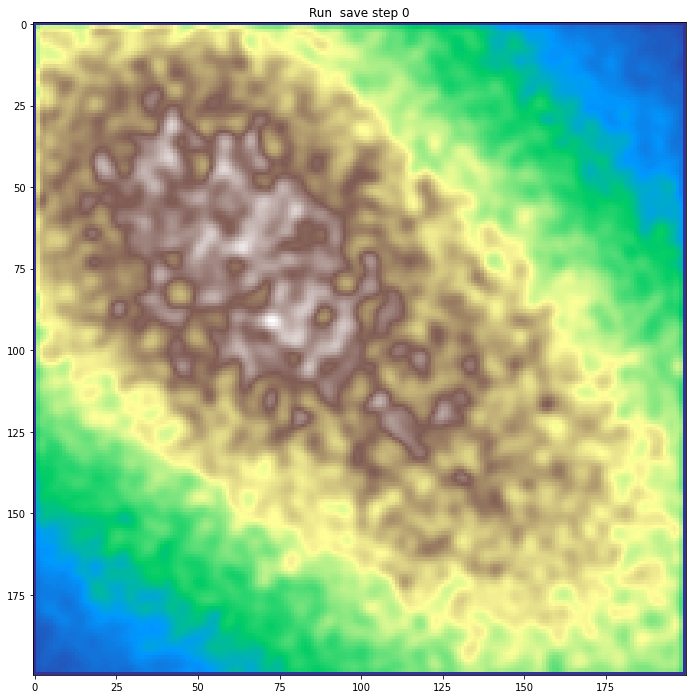

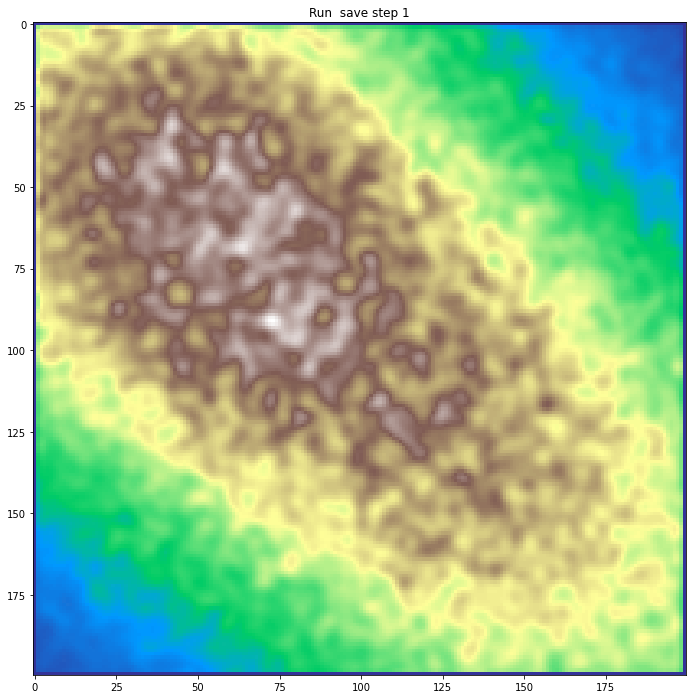

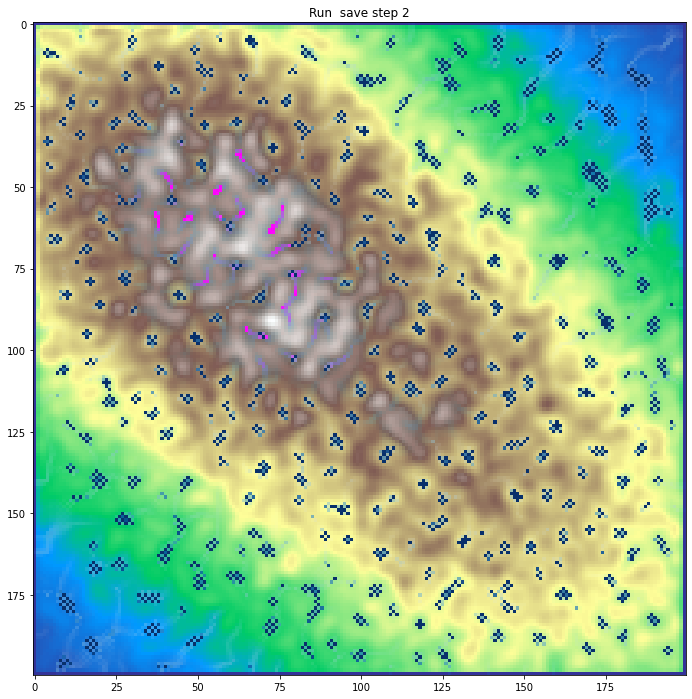

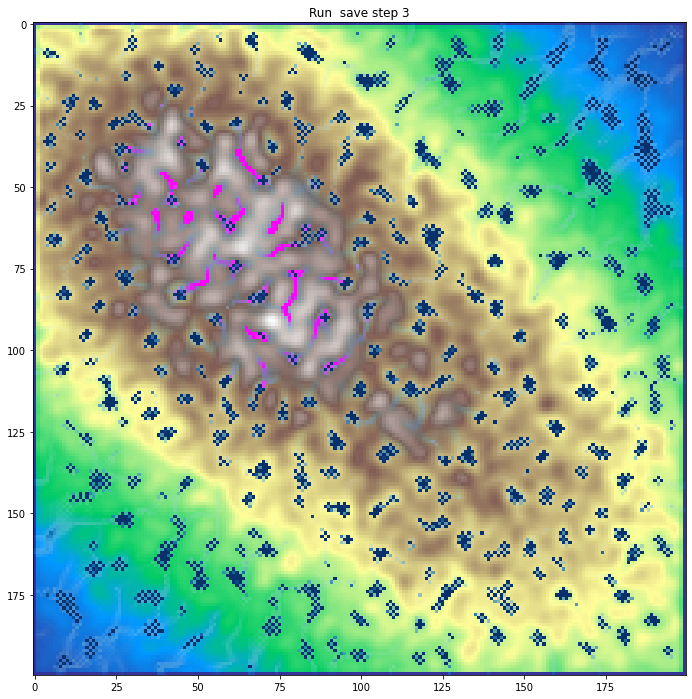

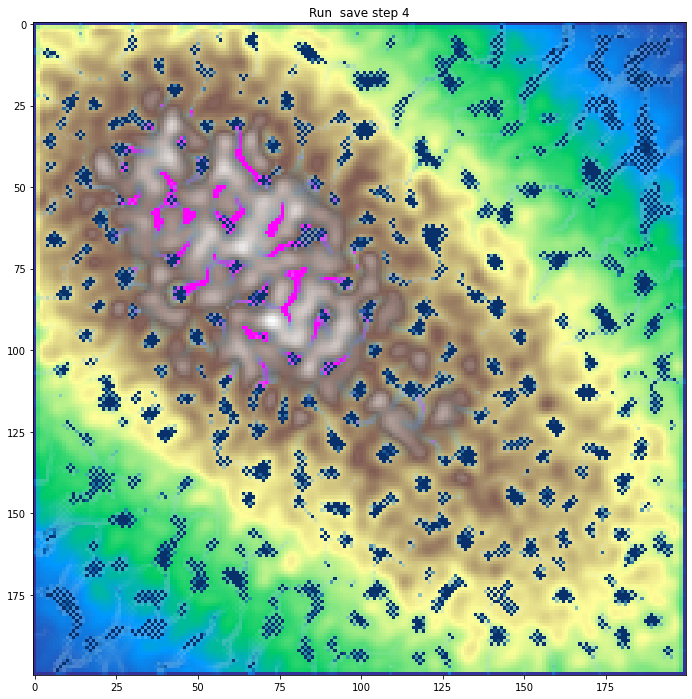

...

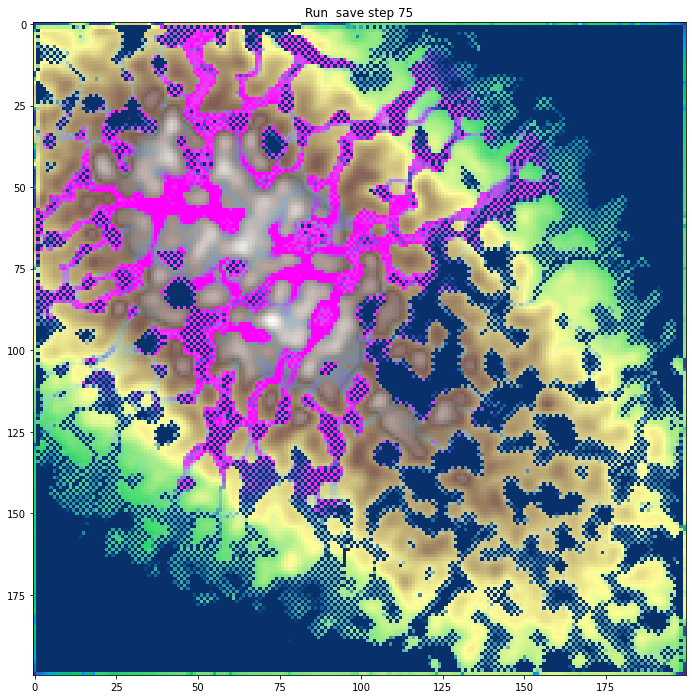

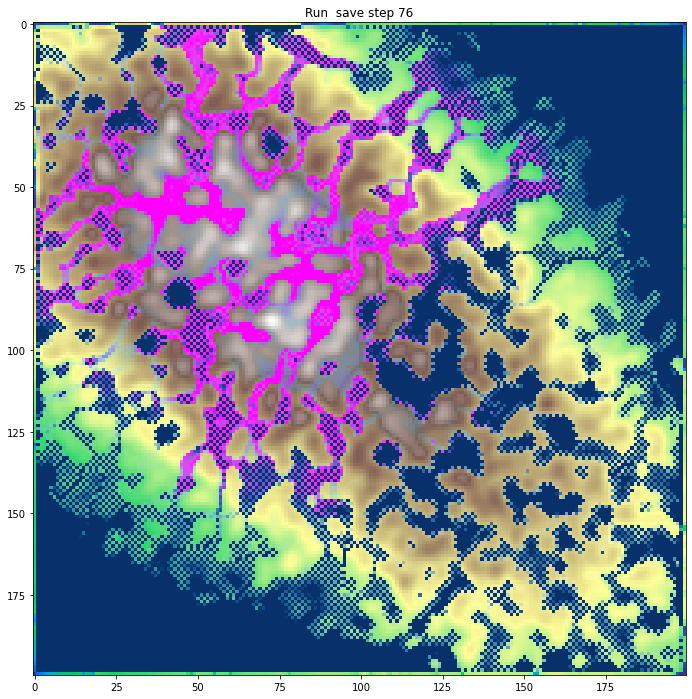

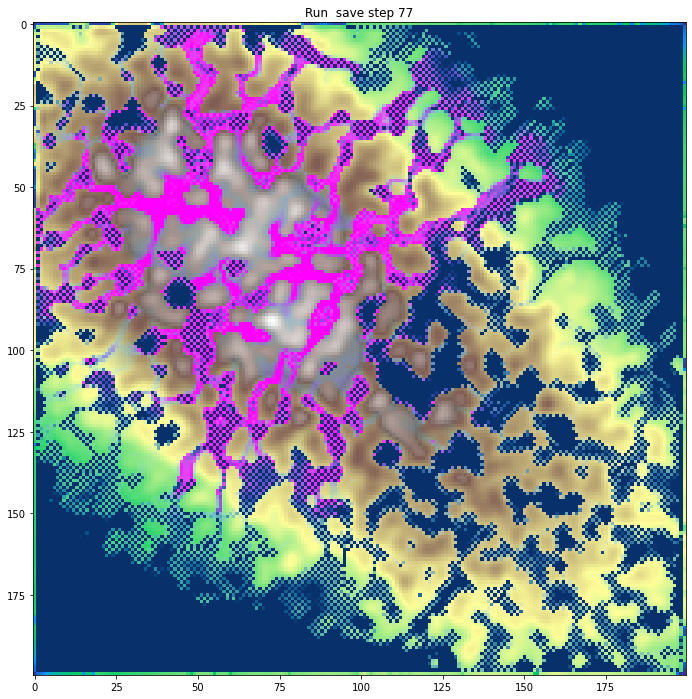

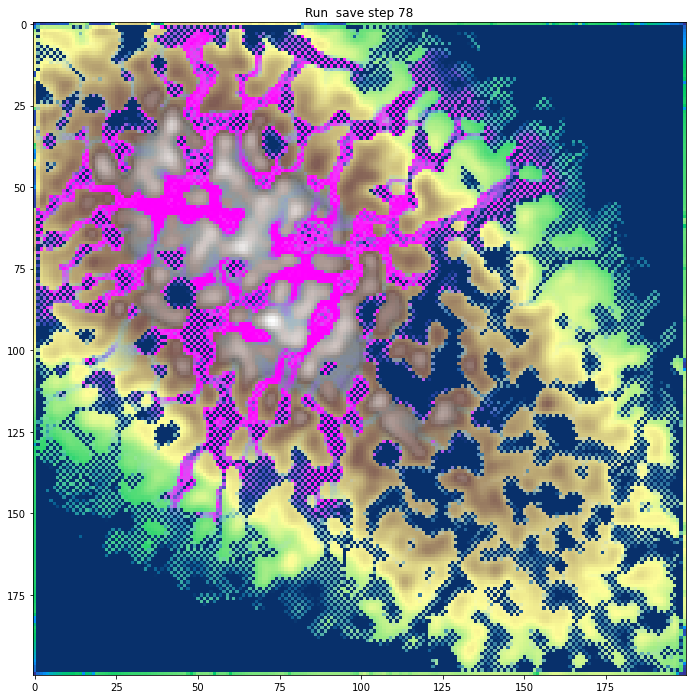

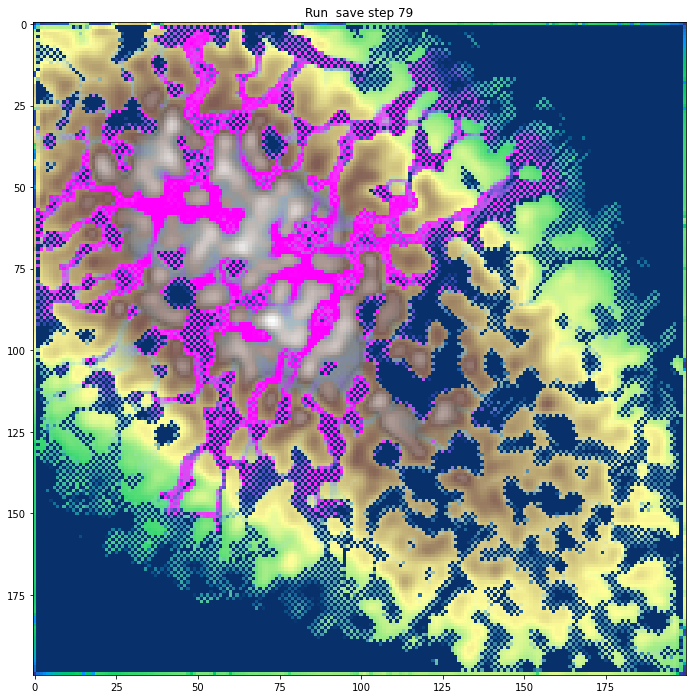

In [262]:
for i in np.arange(80):
    fig = plt.figure(figsize=(12, 12))
    ax = fig.add_subplot(111)
    title = "Run  save step " + str(i)
    ax.set_title(title)
    
#     tmp = ndimage.zoom(all_gravel[i] + all_rock[i], 4)
    tmp = all_rock[i] + all_gravel[i]
    ax.imshow(tmp, cmap=plt.cm.terrain)

#         ax.imshow(all_gravel[j][i], cmap=plt.cm.terrain, )
#     tmp = ndimage.zoom(, 4)

    alphas = all_ice[i] / 10
    alphas[alphas > 1] = 1
    ax.imshow(all_ice[i], cmap=plt.cm.cool, vmin=0, vmax=10, alpha=alphas)

    alphas = all_waters[i] / 10
    alphas[alphas > 1] = 1
    ax.imshow(all_waters[i], cmap=plt.cm.Blues, vmin=0, vmax=10, alpha=alphas)
#     ax.imshow(all_waters[i], cmap=plt.cm.Blues, vmin=0, vmax=10, alpha=1)

/tmp/ipykernel_4431/1678876373.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=(12, 12))


IndexError: list index out of range

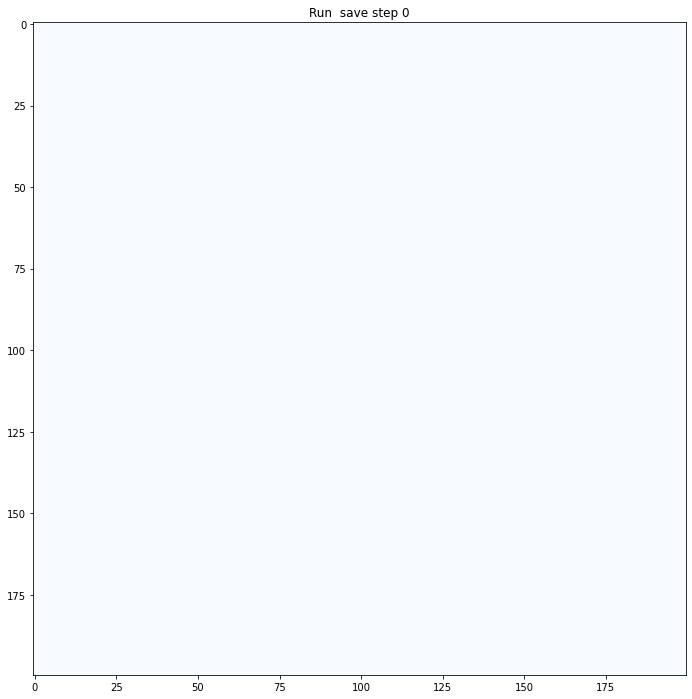

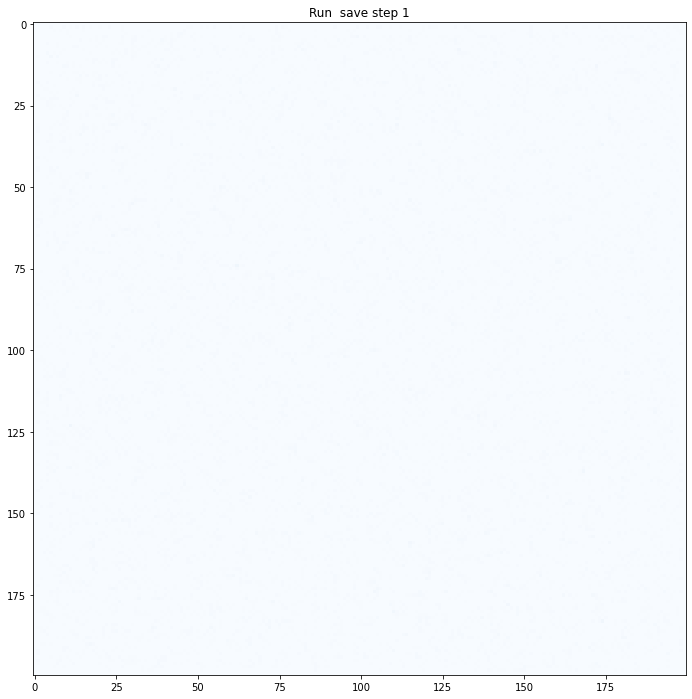

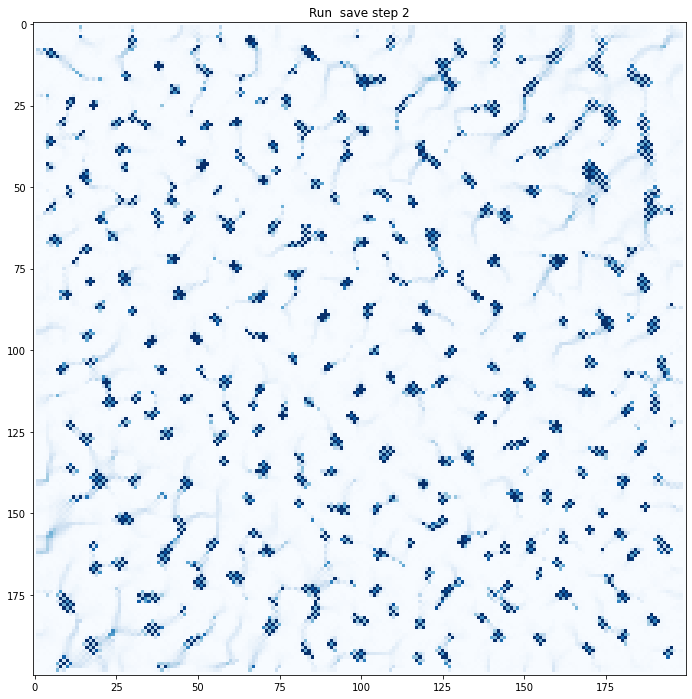

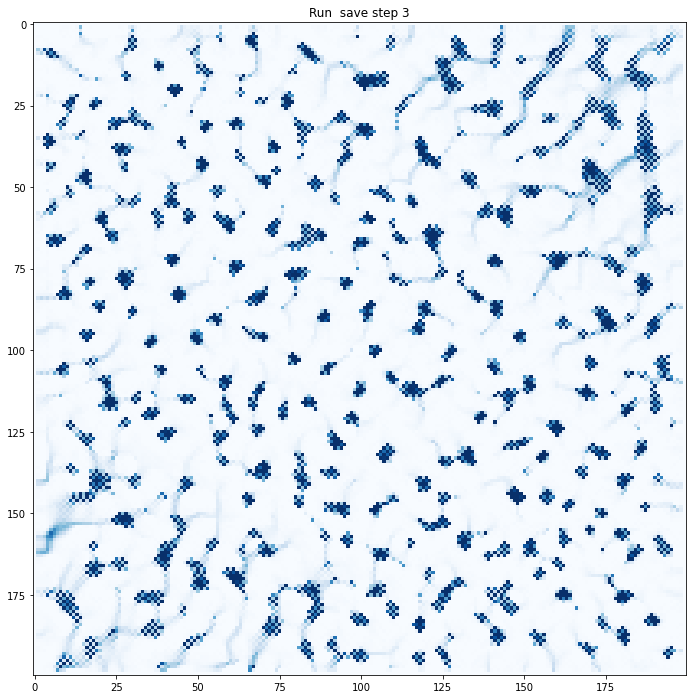

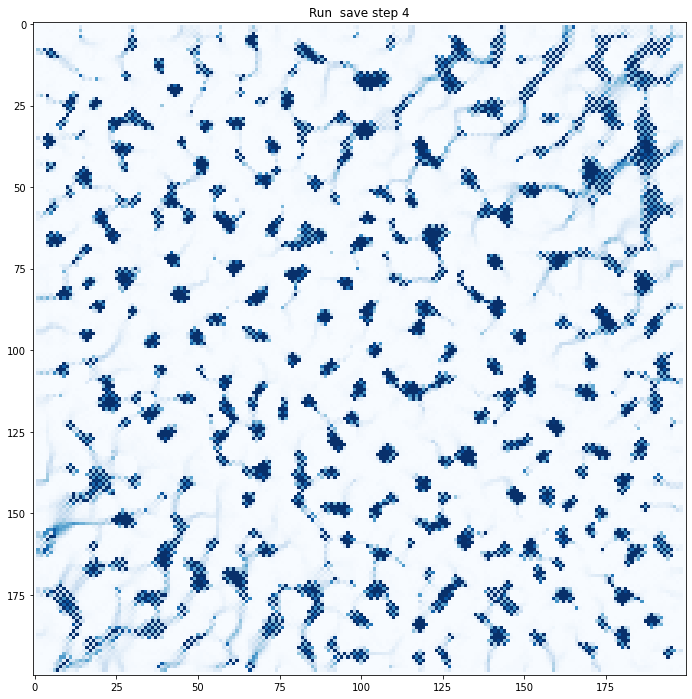

...

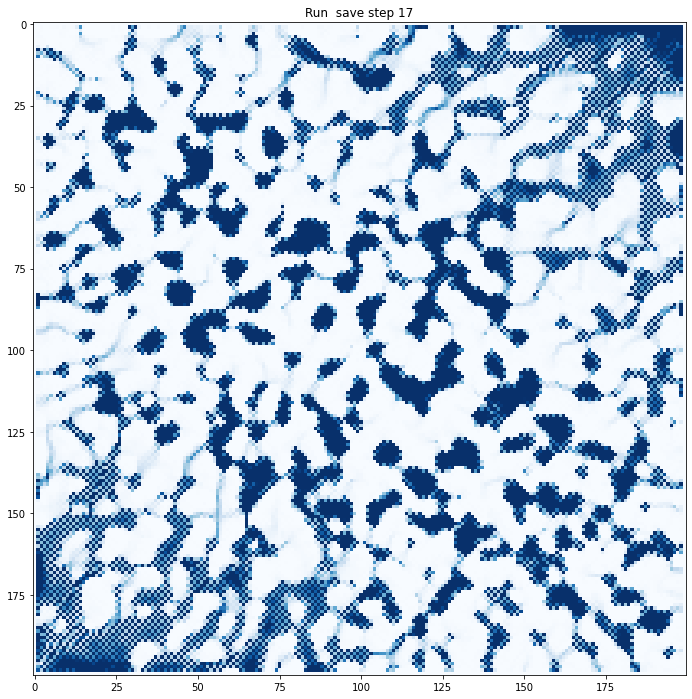

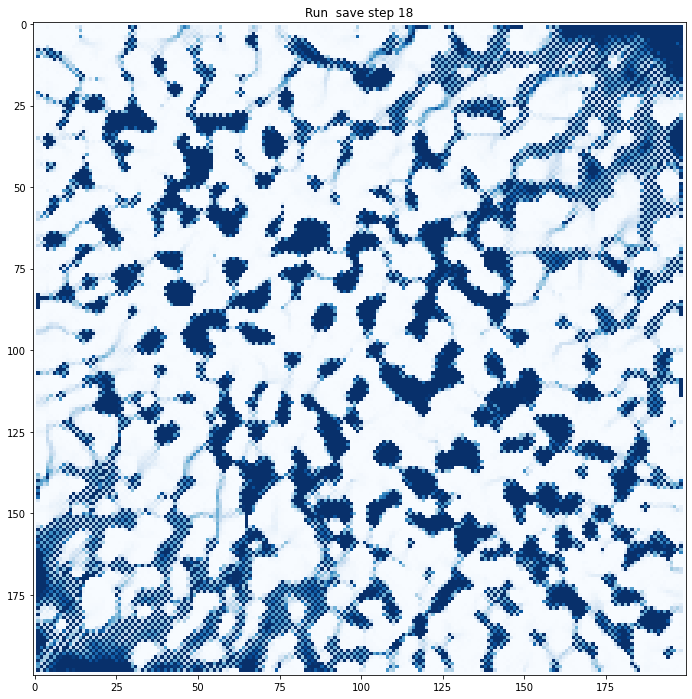

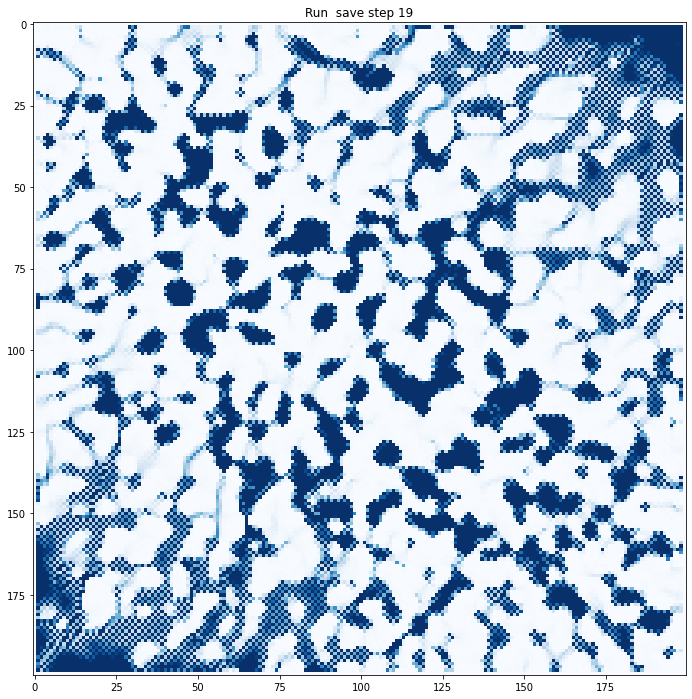

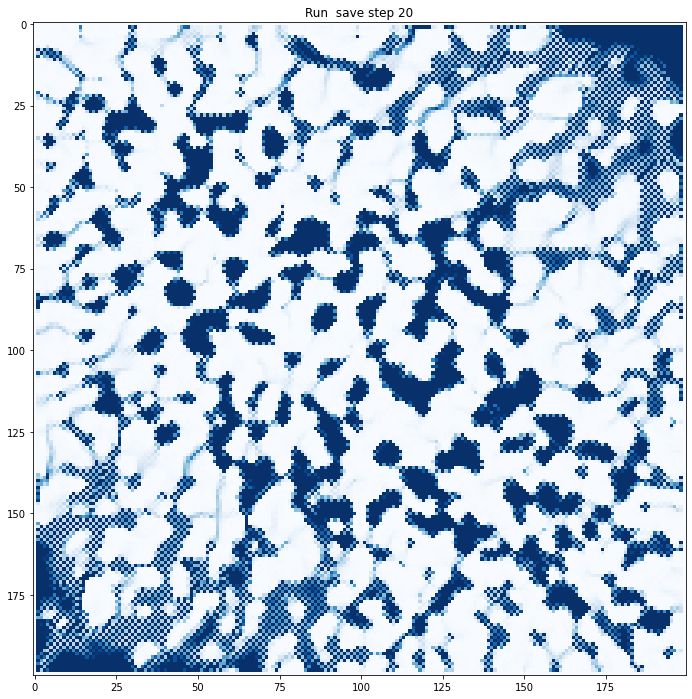

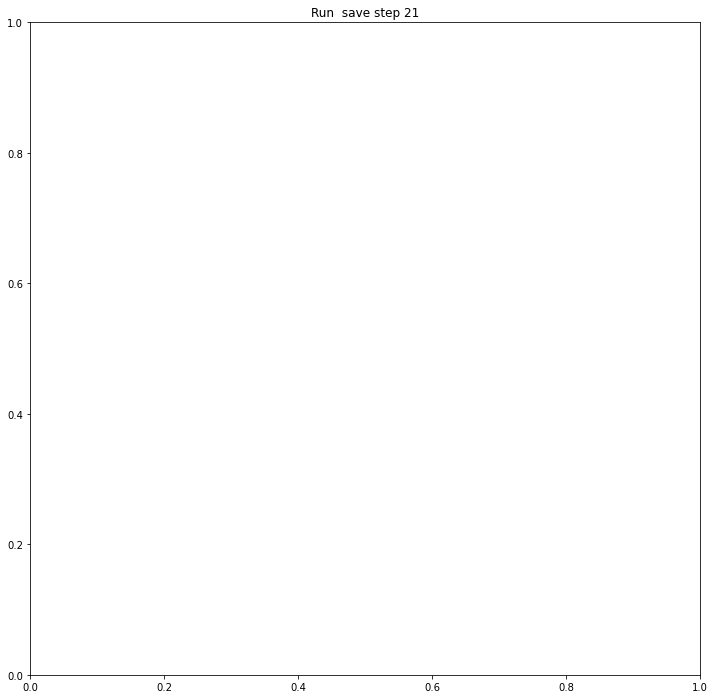

In [247]:
for i in np.arange(40):
    fig = plt.figure(figsize=(12, 12))
    ax = fig.add_subplot(111)
    title = "Run  save step " + str(i)
    ax.set_title(title)
    
#     tmp = ndimage.zoom(all_gravel[i] + all_rock[i], 4)
    tmp = all_gravel[i] + all_rock[i]
    ax.imshow(tmp, cmap=plt.cm.terrain, )

#         ax.imshow(all_gravel[j][i], cmap=plt.cm.terrain, )
#     tmp = ndimage.zoom(, 4)

#     alphas = all_waters[i] / 10
#     alphas[alphas > 1] = 1
#     ax.imshow(all_waters[i], cmap=plt.cm.Blues, vmin=0, vmax=10, alpha=alphas)
    ax.imshow(all_waters[i], cmap=plt.cm.Blues, vmin=0, vmax=10, alpha=1)

In [ ]:
plt.hist(np.log10(tmp.flatten()))
None

In [ ]:
fig = plt.figure(figsize=(12, 12))
ax = fig.add_subplot(111)
title = "Run  save step " + str(i)
ax.set_title(title)    
# tmp1 = ((all_gravel[-1] + all_rock[-1]) + (all_gravel[-2] + all_rock[-2])) / 2. 
tmp = all_waters[-1]
ax.imshow(tmp, vmax=1000, cmap=plt.cm.Blues)

In [ ]:
for i in np.arange(40):
    fig = plt.figure(figsize=(12, 12))
    ax = fig.add_subplot(111)
    title = "Run  save step " + str(i)
    ax.set_title(title)
    
#     tmp = ndimage.zoom(all_gravel[i] + all_rock[i], 4)
    tmp = all_gravel[i] - all_gravel[0]# + all_rock[i]
    ax.imshow(tmp, cmap=plt.cm.BrBG, vmin=-20, vmax=20)

#         ax.imshow(all_gravel[j][i], cmap=plt.cm.terrain, )
#     tmp = ndimage.zoom(, 4)

#     alphas = all_waters[i] / 20
#     alphas[alphas > 1] = 1
#     ax.imshow(all_waters[i], cmap=plt.cm.Blues, vmin=0, vmax=10, alpha=alphas)

In [14]:
water.sum()

NameError: name 'water' is not defined

In [ ]:
len(zland.flatten())